# Data Collection for Classification task

Using Beautiful Soup and requests.

## Installations

In [ ]:
!pip install --upgrade selenium
!pip install --upgrade webdriver_manager

## Import stuffs

In [16]:
import pandas as pd
from selenium import webdriver
import requests
import os
import time
from bs4 import BeautifulSoup
from selenium.webdriver.support.ui import Select
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.service import Service as ChromeService
from webdriver_manager.chrome import ChromeDriverManager
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.support.ui import WebDriverWait
from PIL import Image


## Setup chrome driver

In [80]:
options = webdriver.ChromeOptions()
options.add_argument('user-agent=Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/41.0.2228.0 Safari/537.36')
driver = webdriver.Chrome(service=ChromeService(ChromeDriverManager().install()))

## Define configs

In [81]:
number_of_images = 400
GET_IMAGE_TIMEOUT = 2
SLEEP_BETWEEN_INTERACTIONS = 2
SLEEP_BEFORE_MORE = 1
IMAGE_QUALITY = 85


## Fetch urls 

### Build searchable url using query test

In [82]:
def build_query(query_text):

    search_url = "https://www.google.com/search?safe=off&site=&tbm=isch&source=hp&q={q}&oq={q}&gs_l=img"

    return search_url.format(q=query_text)



### Scroll to the end of the page

In [83]:
def scroll_to_end(web_driver, sleep_time):
    
    wait = WebDriverWait(driver, sleep_time) 
    web_driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    wait.until(EC.presence_of_element_located((By.XPATH, '//img[@class="rg_i Q4LuWd"]')))
    

### Save fetched urls

In [84]:
def save_urls_to_file(image_urls: list, file_path: str):
    with open(file_path, 'w') as file:
        for url in image_urls:
            file.write(url + '\n')


### Function for fetching urls

In [85]:

def fetch_image_urls(query: str, max_links_to_fetch: int, wd: webdriver, sleep_between_interactions: int = 1, save_file: str = None):
   
    #build_query
    q = build_query(query)
    print(f"user's query {q}")

    # load the page
    wd.get(q)

    # Declared as a set, to prevent duplicates.
    image_urls = set()
    image_count = 0
    results_start = 0
    iteration_num = 0

    while image_count < max_links_to_fetch:
        
        iteration_num += 1

        scroll_to_end(wd, sleep_between_interactions)

        # Get all image thumbnail results
        thumbnail_results = wd.find_elements(By.XPATH, '//img[@class="rg_i Q4LuWd"]')
        
        number_results = len(thumbnail_results)

        print("iteration_num : "+str(iteration_num))
        print(f"Found: {number_results} search results. Extracting links from {results_start}:{number_results}")

        # Loop through image thumbnail identified
        for img in thumbnail_results[results_start:number_results]:
            
            # Try to click every thumbnail such that we can get the real image behind it.
            try:
                img.click()

                time.sleep(sleep_between_interactions)
                
            except Exception as e:
                
                print(f"Error clicking thumbnail: {str(e)}")
                continue

            actual_images = wd.find_elements(By.XPATH, '//img[@class="r48jcc pT0Scc iPVvYb"]')

            for actual_image in actual_images:
                
                src = actual_image.get_attribute("src")
                print(src)
                if  src and "http" in src:
                    image_urls.add(src)

            # Extract image urls
            #actual_images = wd.find_elements(By.XPATH, '//img[@class="rg_i Q4LuWd"]')

            image_count = len(image_urls)

            # If the number images found exceeds our `num_of_images`, end the seaerch.
            if len(image_urls) >= max_links_to_fetch:

                print(f"Found: {len(image_urls)} image links, done!")

                break

            else:
                # If we haven't found all the images we want, let's look for more.
                
                print("Found:", len(image_urls), "image links, looking for more ...")
                
                time.sleep(SLEEP_BEFORE_MORE)

        # If there is a "Load More" button, click it.
        load_more_button = wd.find_element(By.CSS_SELECTOR, ".LZ4I")

        if load_more_button:
            wd.execute_script("document.querySelector('.LZ4I').click();")
                    
        print(f"Downloaded {image_count} image links.")

        # Move the result startpoint further down.
        results_start = len(thumbnail_results)

        if(save_file):
            save_urls_to_file(image_urls, save_file)
        
    wd.quit()
    
    return image_urls


**Get urls for each task**

In [ ]:
#propmts
#fetch links of images task type 1
#Chef adding ingredients in recipe

image_urls_task_1 = fetch_image_urls("Chef adding ingredients in recipe", 500, driver, 1, "task1.txt")

user's query https://www.google.com/search?safe=off&site=&tbm=isch&source=hp&q=Stirring while cooking&oq=Stirring while cooking&gs_l=img
iteration_num : 1
Found: 48 search results. Extracting links from 0:48
Found: 0 image links, looking for more ...
https://3.bp.blogspot.com/-xMxbaRsju2I/ULTujZecAcI/AAAAAAAAAm4/0y2I585fYeA/s1600/stirring+pot.jpg
Found: 1 image links, looking for more ...
https://www.tastingtable.com/img/gallery/the-most-important-time-to-stir-pasta-while-cooking/l-intro-1651506580.jpg
Found: 2 image links, looking for more ...
https://www.seriouseats.com/thmb/8WWNPS__Kz5XaW2nINQ-k9Aysms=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/WokSills101-StirFrying-VickyWasik1-947e9de8656942a185a124d561050d8e.jpg
Found: 3 image links, looking for more ...
https://media.istockphoto.com/id/1153386183/photo/close-up-of-unrecognizable-woman-preparing-lunch-in-the-kitchen.jpg?s=612x612&w=0&k=20&c=OfZT43t5phGfbdZfchN5XbBnleJt6KnyNnzkuHVi8_c=
Found: 4 image links, looking 
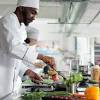
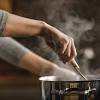

WebDriverException: Message: disconnected: Unable to receive message from renderer
  (failed to check if window was closed: disconnected: not connected to DevTools)
  (Session info: chrome=114.0.5735.198)
Stacktrace:
0   chromedriver                        0x0000000102ec66b8 chromedriver + 4937400
1   chromedriver                        0x0000000102ebdb73 chromedriver + 4901747
2   chromedriver                        0x0000000102a7b616 chromedriver + 435734
3   chromedriver                        0x0000000102a62ac9 chromedriver + 334537
4   chromedriver                        0x0000000102a6273c chromedriver + 333628
5   chromedriver                        0x0000000102a60faa chromedriver + 327594
6   chromedriver                        0x0000000102a614fc chromedriver + 328956
7   chromedriver                        0x0000000102a802cb chromedriver + 455371
8   chromedriver                        0x0000000102a839bf chromedriver + 469439
9   chromedriver                        0x0000000102afebce chromedriver + 973774
10  chromedriver                        0x0000000102ae3012 chromedriver + 860178
11  chromedriver                        0x0000000102afde76 chromedriver + 970358
12  chromedriver                        0x0000000102ae2de3 chromedriver + 859619
13  chromedriver                        0x0000000102ab0d7f chromedriver + 654719
14  chromedriver                        0x0000000102ab20de chromedriver + 659678
15  chromedriver                        0x0000000102e822ad chromedriver + 4657837
16  chromedriver                        0x0000000102e87130 chromedriver + 4677936
17  chromedriver                        0x0000000102e8ddef chromedriver + 4705775
18  chromedriver                        0x0000000102e8805a chromedriver + 4681818
19  chromedriver                        0x0000000102e5a92c chromedriver + 4495660
20  chromedriver                        0x0000000102ea5838 chromedriver + 4802616
21  chromedriver                        0x0000000102ea59b7 chromedriver + 4802999
22  chromedriver                        0x0000000102eb699f chromedriver + 4872607
23  libsystem_pthread.dylib             0x00007ff80d5271d3 _pthread_start + 125
24  libsystem_pthread.dylib             0x00007ff80d522bd3 thread_start + 15


In [86]:
#fetch links of imahes for task type 2
image_urls_task_2 = fetch_image_urls("Stirring while cooking", 500, driver, 1, "task2.txt")


## Download images

In [34]:
root_dir = "classification_data"

In [35]:
def is_valid_image(filename):
    try:
        image = Image.open(filename)
        image.verify()
        return True
    except (IOError, SyntaxError) as e:
        return False

In [36]:
def download_images(image_urls, output_directory):
    
    os.makedirs(output_directory, exist_ok=True)
    
    for index, url in enumerate(image_urls):
        try:
            
            response = requests.get(url)
            response.raise_for_status()
            
            # Extract the filename from the URL
            filename = os.path.join(output_directory, f"image_{index+1}.jpg")
            
            # Save the image to the output directory
            with open(filename, "wb") as file:

                file.write(response.content)

            if not is_valid_image(filename):

                #os.remove(filename) 
                print(f"Skipped non-image file: {url}")
                continue
            
            print(f"Downloaded image {index+1}/{len(image_urls)}")
        
        except Exception as e:

            print(f"Error downloading image {index+1}: {str(e)}")


In [40]:


def get_urls(file_path):
    
    url_list = [] 
    with open(file_path, "r") as file:
        for line in file:
            url_list.append(line.strip())
            #download_images(line, root_dir)
    return url_list

In [38]:
url_list = get_urls("task1.txt")
print(f"total urls : {len(url_list)}")
download_images(url_list, root_dir+"/adding_ingredients/")

total urls : 250
Downloaded image 1/250
Downloaded image 2/250
Downloaded image 3/250
Downloaded image 4/250
Downloaded image 5/250
Downloaded image 6/250
Error downloading image 7: 403 Client Error: Forbidden for url: https://cheflolaskitchen.com/wp-content/uploads/2022/02/DSC_1480-carribean-green-sauce-683x1024.jpg.webp
Downloaded image 8/250
Downloaded image 9/250
Downloaded image 10/250
Downloaded image 11/250
Downloaded image 12/250
Downloaded image 13/250
Downloaded image 14/250
Downloaded image 15/250
Downloaded image 16/250
Downloaded image 17/250
Downloaded image 18/250
Error downloading image 19: 403 Client Error: Forbidden for url: https://sugargeekshow.com/wp-content/uploads/2022/02/entremet_recipe_FEATURED.jpg
Downloaded image 20/250
Downloaded image 21/250
Downloaded image 22/250
Downloaded image 23/250
Downloaded image 24/250
Error downloading image 25: 403 Client Error: Forbidden for url: https://cdn.tatlerasia.com/asiatatler/i/sg/2021/06/30152340-mushroom-bulgogi-set-1

In [42]:
url_list = get_urls("task2.txt")
print(f"total urls : {len(url_list)}")
download_images(url_list, root_dir+"/stirring/")

total urls : 214
Downloaded image 1/214
Downloaded image 2/214
Error downloading image 3: 403 Client Error: Forbidden for url: https://eatthegains.com/wp-content/uploads/2022/03/Ground-Beef-and-Cabbage-Stir-Fry-8-560x560.jpg
Downloaded image 4/214
Downloaded image 5/214
Downloaded image 6/214
Error downloading image 7: 403 Client Error: Forbidden for url: https://www.veganricha.com/wp-content/uploads/2023/03/Tofu-Gochujang-Stir-Fry-8204.jpg
Downloaded image 8/214
Downloaded image 9/214
Downloaded image 10/214
Downloaded image 11/214
Downloaded image 12/214
Error downloading image 13: 403 Client Error: Forbidden for url: https://www.jessicagavin.com/wp-content/uploads/2020/01/how-to-cook-bok-choy-9-600x900.jpg
Error downloading image 14: 403 Client Error: Forbidden for url: https://sipbitego.com/wp-content/uploads/2021/06/Sauteed-Onions-And-Peppers-For-Fajitas-Steak-Sides-Sip-Bite-Go-feature.jpg
Downloaded image 15/214
Downloaded image 16/214
Downloaded image 17/214
Downloaded image 18/